# Dogs Pose Recognition

## Setup

In [3]:
# https://docs.ultralytics.com/yolov5/tutorials/train_custom_data/
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -r requirements.txt
%pip install roboflow wandb

Cloning into 'yolov5'...
remote: Enumerating objects: 15615, done.
remote: Counting objects: 100% (222/222), done.
remote: Compressing objects: 100% (163/163), done.
remote: Total 15615 (delta 103), reused 125 (delta 59), pack-reused 15393
Receiving objects: 100% (15615/15615), 14.60 MiB | 30.07 MiB/s, done.
Resolving deltas: 100% (10632/10632), done.
/content/yolov5/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [23]:
from roboflow import Roboflow
import torch
import os
import glob
import wandb
import sys
from google.colab import drive
from getpass import getpass
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
from google.colab import files

In [5]:
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [6]:
roboflow_api_key = getpass('Enter roboflow api key: ') #zcKVqi5vxINL3L2pQUT6

Enter roboflow api key: ··········


In [7]:
roboflow_dataset_version = "13" #@param {type:"string"}

In [9]:
rf = Roboflow(api_key=roboflow_api_key)
project = rf.workspace("emgs").project("dogs-pose-recognition")
dataset = project.version(roboflow_dataset_version).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Dogs-Pose-Recognition-13 in yolov5pytorch:: 100%|██████████| 1283/1283 [00:00<00:00, 1511.64it/s]


In [10]:
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 2.0.0+cu118 (Tesla T4)


In [11]:
def wandb_colab_login():
  """Temporary hack to prevent colab from hanging"""
  sys.modules["google.colab2"] = sys.modules["google.colab"]
  del sys.modules["google.colab"]
  wandb.login()
  sys.modules["google.colab"] = sys.modules["google.colab2"]
wandb_colab_login()

ERROR:wandb.jupyter:Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


## Training

In [12]:
!python train.py --img 640 --epochs 4000 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache true

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: Currently logged in as: emgs. Use `wandb login --relogin` to force relogin
train: weights=yolov5s.pt, cfg=, data=/content/yolov5/yolov5/Dogs-Pose-Recognition-13/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=4000, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=true, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-158-g8211a03 Python-3.10.11 torch-2.0.0+cu11

In [15]:
%cp -r runs/train /content/gdrive/MyDrive/dogs-pose-steps/

## Detection

In [21]:
!python detect.py --weights /content/gdrive/MyDrive/dogs-pose-steps/train/exp/weights/best.pt --conf 0.1 --source {dataset.location}/valid/images

detect: weights=['/content/gdrive/MyDrive/dogs-pose-steps/train/exp/weights/best.pt'], source=/content/yolov5/yolov5/Dogs-Pose-Recognition-13/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-158-g8211a03 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/129 /content/yolov5/yolov5/Dogs-Pose-Recognition-13/valid/images/100_jpg.rf.bb0324a1ab7ec35d73f4ca69bc53a12b.jpg: 640x640 2 laying downs, 11.5ms
image 2/129 /content/yolov5/yolov5/Dogs-Pose-Recognition-13/valid/images/116_jpg.rf.982563a8e5791a32e61241ccc00fed13.j

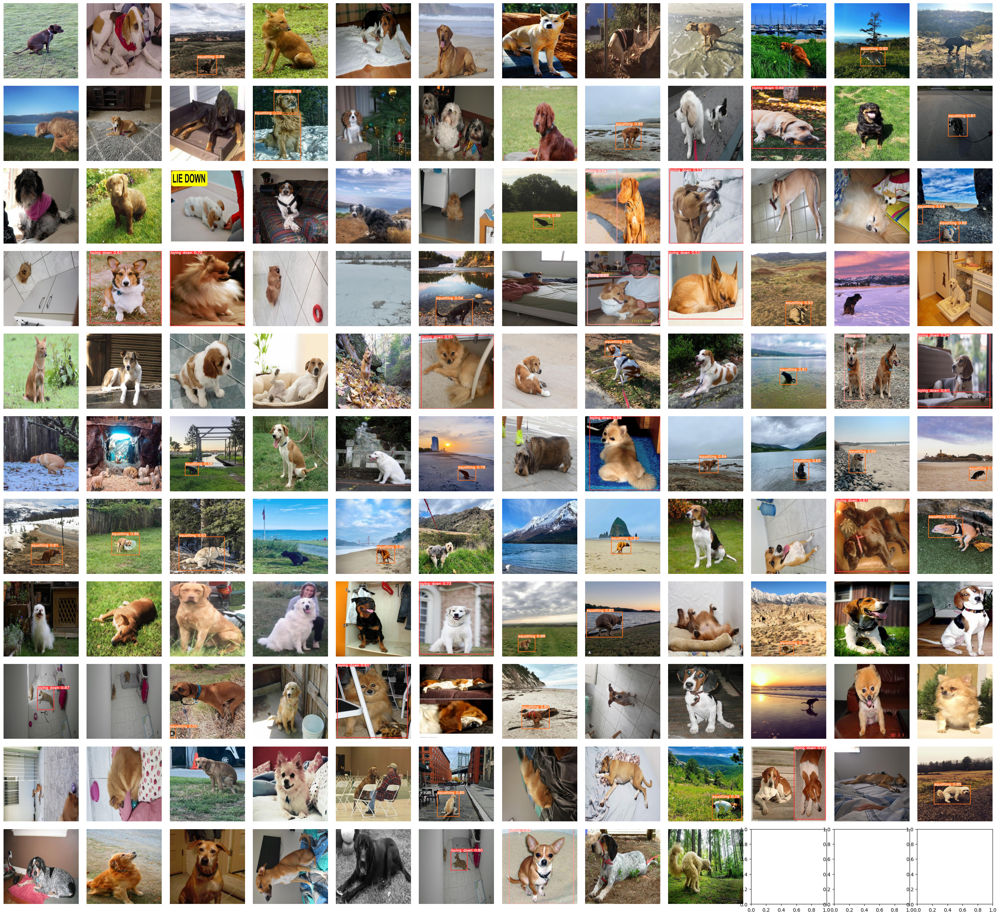

In [22]:
folder_path = 'runs/detect/exp'
img_size = 640

img_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.jpg')]

n_rows = int(len(img_files)**0.5)
n_cols = int(len(img_files)/n_rows) + 1
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3))

for i, ax in enumerate(axes.flatten()):
    if i < len(img_files):
        img = Image.open(img_files[i])
        ax.imshow(img)
        ax.axis('off')

plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()